<a href="https://colab.research.google.com/github/sethharris17/sethharris-P2-portfolio/blob/main/Seth_Harris_IS6733Lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Train a Neural Network to Predict Quality of Wine
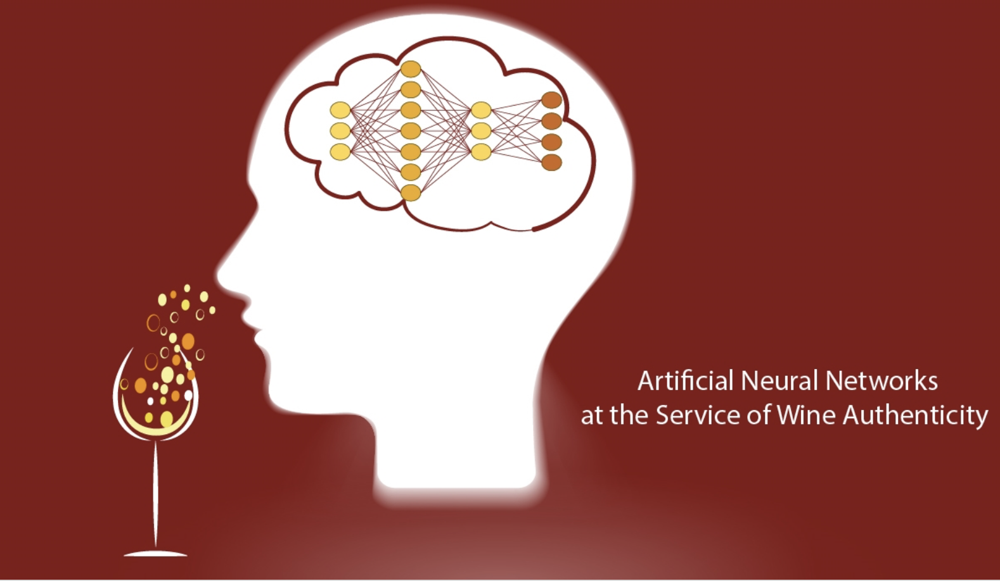
* In this lab, you will first train a neural network on a public dataset, then make several enhancements to the lab.
* Tasks breakdown:
  * Code running: 10%
  * Enhancement 1: 15%
  * Enhancement 2: 15%
  * Enhancement 3: 10%
  * Enhancement 4: 10%
  * Enhancement 5: 40%


## Imports

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Dataset

In [ ]:
data_df = pd.read_csv('/content/drive/My Drive/winequality-red.csv')


In [ ]:
data_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
# how many features?
len(data_df.columns) - 1

11

In [ ]:
# list the label names
print(data_df.columns)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')


In [ ]:
# how many labels? If yours is a binary classification task, then you'll have 2 labels.
data_df.quality.unique()

array([5, 6, 7, 4, 8, 3])

In [ ]:
# convert these quaity measures to labels (0 to 5)
def get_label(quality):
    if quality == 3:
        return 0
    elif quality == 4:
        return 1
    elif quality == 5:
        return 2
    elif quality == 6:
        return 3
    elif quality == 7:
        return 4
    else:
        return 5

labels = data_df['quality'].apply(get_label)

# normalize data
data_df = (data_df - data_df.mean()) / data_df.std()
data_df['label'] = labels

In [ ]:
data_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label
0,-0.528194,0.961576,-1.391037,-0.453077,-0.243630,-0.466047,-0.379014,0.558100,1.288240,-0.579025,-0.959946,-0.787576,2
1,-0.298454,1.966827,-1.391037,0.043403,0.223805,0.872365,0.624168,0.028252,-0.719708,0.128910,-0.584594,-0.787576,2
2,-0.298454,1.296660,-1.185699,-0.169374,0.096323,-0.083643,0.228975,0.134222,-0.331073,-0.048074,-0.584594,-0.787576,2
3,1.654339,-1.384011,1.483689,-0.453077,-0.264878,0.107558,0.411372,0.664069,-0.978798,-0.461036,-0.584594,0.450707,3
4,-0.528194,0.961576,-1.391037,-0.453077,-0.243630,-0.466047,-0.379014,0.558100,1.288240,-0.579025,-0.959946,-0.787576,2


In [ ]:
# sumamry statistics of the data
data_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label
count,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1599.000000
mean,3.554936e-16,1.688594e-16,-1.066481e-16,-1.110917e-16,2.132961e-16,-6.221137e-17,2.666202e-17,-3.469617e-14,2.861723e-15,6.665504e-16,7.109871e-17,6.221137e-17,2.636023
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.807569
min,-2.136377e+00,-2.277567e+00,-1.391037e+00,-1.162333e+00,-1.603443e+00,-1.422055e+00,-1.230199e+00,-3.537625e+00,-3.699244e+00,-1.935902e+00,-1.898325e+00,-3.264143e+00,0.000000
25%,-7.004996e-01,-7.696903e-01,-9.290275e-01,-4.530767e-01,-3.711129e-01,-8.484502e-01,-7.438076e-01,-6.075656e-01,-6.549356e-01,-6.380200e-01,-8.661079e-01,-7.875763e-01,2.000000
50%,-2.410190e-01,-4.367545e-02,-5.634264e-02,-2.402999e-01,-1.798892e-01,-1.792441e-01,-2.574163e-01,1.759533e-03,-7.210449e-03,-2.250577e-01,-2.092427e-01,4.507074e-01,3.000000
75%,5.056370e-01,6.264921e-01,7.650078e-01,4.340257e-02,5.382858e-02,4.899619e-01,4.721707e-01,5.766445e-01,5.757422e-01,4.238832e-01,6.352984e-01,4.507074e-01,3.000000
max,4.353787e+00,5.876138e+00,3.742403e+00,9.192806e+00,1.112355e+01,5.365606e+00,7.372847e+00,3.678904e+00,4.526866e+00,7.916200e+00,4.201138e+00,2.927275e+00,5.000000


## Load this dataset for training a neural network

In [ ]:
# The dataset class
class WineDataset(Dataset):

    def __init__(self, data_df):
        self.data_df = data_df
        self.features = []
        self.labels = []
        for _, i in data_df.iterrows():
          self.features.append([i['fixed acidity'], i['volatile acidity'], i['citric acid'], i['residual sugar'], i['chlorides'], i['free sulfur dioxide'], i['total sulfur dioxide'], i['density'], i['pH'], i['sulphates'], i['alcohol']])
          self.labels.append(i['label'])

    def __len__(self):
        return len(self.data_df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        features = self.features[idx]
        features = torch.FloatTensor(features)

        labels = torch.tensor(self.labels[idx], dtype = torch.long)

        return {'labels': labels, 'features': features}

wine_dataset = WineDataset(data_df)
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(wine_dataset, [0.8, 0.1, 0.1])

# The dataloader
train_dataloader = DataLoader(train_dataset, batch_size = 4, shuffle = True, num_workers = 0)
val_dataloader = DataLoader(val_dataset, batch_size = 4, shuffle = False, num_workers = 0)
test_dataloader = DataLoader(test_dataset, batch_size = 4, shuffle = False, num_workers = 0)

In [ ]:
# peak into the dataset
for i in wine_dataset:
  print(i)
  break

{'labels': tensor(2), 'features': tensor([-0.5282,  0.9616, -1.3910, -0.4531, -0.2436, -0.4660, -0.3790,  0.5581,
         1.2882, -0.5790, -0.9599])}


## Neural Network

In [ ]:
# change the device to gpu if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
class WineModel(torch.nn.Module):

    def __init__(self):
        super(WineModel, self).__init__()

        self.linear1 = torch.nn.Linear(11, 200)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(200, 6)
        self.softmax = torch.nn.Softmax()

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        x = self.softmax(x)
        return x

winemodel = WineModel().to(device)

## Training

In [ ]:
# Define and the loss function and optimizer
criterion = nn.CrossEntropyLoss().to(device)
optimizer = AdamW(winemodel.parameters(), lr = 1e-3)

In [ ]:
# Lets define the training steps
def accuracy(preds, labels):
    preds = torch.argmax(preds, dim=1).flatten()
    labels = labels.flatten()
    return torch.sum(preds == labels) / len(labels)

def train(model, data_loader, optimizer, criterion):
  epoch_loss = 0
  epoch_acc = 0

  model.train()
  for d in tqdm(data_loader):
    inputs = d['features'].to(device)
    labels = d['labels'].to(device)
    outputs = winemodel(inputs)

    _, preds = torch.max(outputs, dim=1)
    loss = criterion(outputs, labels)
    acc = accuracy(outputs, labels)

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    epoch_loss += loss.item()
    epoch_acc += acc.item()

  return epoch_loss / len(data_loader), epoch_acc / len(data_loader)

# Lets define the testing steps
def evaluate(model, data_loader, criterion):
    epoch_loss = 0
    epoch_acc = 0

    model.eval()
    with torch.no_grad():
      for d in data_loader:
        inputs = d['features'].to(device)
        labels = d['labels'].to(device)
        outputs = winemodel(inputs)

        _, preds = torch.max(outputs, dim=1)
        loss = criterion(outputs, labels)
        acc = accuracy(outputs, labels)

        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(data_loader), epoch_acc / len(data_loader)

In [ ]:
# Let's train our model
for epoch in range(100):
    train_loss, train_acc = train(winemodel, train_dataloader, optimizer, criterion)
    valid_loss, valid_acc = evaluate(winemodel, val_dataloader, criterion)

    print(f'| Epoch: {epoch+1:02} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}% |')

  0%|          | 0/320 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


| Epoch: 01 | Train Loss: 1.535 | Train Acc: 54.37% | Val. Loss: 1.535 | Val. Acc: 46.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 02 | Train Loss: 1.452 | Train Acc: 59.84% | Val. Loss: 1.520 | Val. Acc: 49.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 03 | Train Loss: 1.442 | Train Acc: 60.55% | Val. Loss: 1.513 | Val. Acc: 51.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 04 | Train Loss: 1.435 | Train Acc: 61.33% | Val. Loss: 1.524 | Val. Acc: 49.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 05 | Train Loss: 1.428 | Train Acc: 61.56% | Val. Loss: 1.508 | Val. Acc: 51.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 06 | Train Loss: 1.424 | Train Acc: 61.95% | Val. Loss: 1.506 | Val. Acc: 50.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 07 | Train Loss: 1.422 | Train Acc: 62.27% | Val. Loss: 1.515 | Val. Acc: 51.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 08 | Train Loss: 1.418 | Train Acc: 62.58% | Val. Loss: 1.498 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 09 | Train Loss: 1.417 | Train Acc: 63.05% | Val. Loss: 1.509 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 10 | Train Loss: 1.413 | Train Acc: 63.44% | Val. Loss: 1.511 | Val. Acc: 52.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 11 | Train Loss: 1.410 | Train Acc: 63.98% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 12 | Train Loss: 1.410 | Train Acc: 63.12% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 13 | Train Loss: 1.408 | Train Acc: 63.91% | Val. Loss: 1.511 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 14 | Train Loss: 1.404 | Train Acc: 63.91% | Val. Loss: 1.497 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 15 | Train Loss: 1.406 | Train Acc: 64.30% | Val. Loss: 1.506 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 16 | Train Loss: 1.403 | Train Acc: 64.30% | Val. Loss: 1.509 | Val. Acc: 52.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 17 | Train Loss: 1.403 | Train Acc: 64.53% | Val. Loss: 1.509 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 18 | Train Loss: 1.402 | Train Acc: 65.08% | Val. Loss: 1.509 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 19 | Train Loss: 1.398 | Train Acc: 65.08% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 20 | Train Loss: 1.398 | Train Acc: 64.92% | Val. Loss: 1.497 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 21 | Train Loss: 1.397 | Train Acc: 65.39% | Val. Loss: 1.492 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 22 | Train Loss: 1.395 | Train Acc: 65.47% | Val. Loss: 1.500 | Val. Acc: 52.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 23 | Train Loss: 1.394 | Train Acc: 65.62% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 24 | Train Loss: 1.395 | Train Acc: 65.23% | Val. Loss: 1.492 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 25 | Train Loss: 1.395 | Train Acc: 65.08% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 26 | Train Loss: 1.393 | Train Acc: 65.31% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 27 | Train Loss: 1.390 | Train Acc: 65.70% | Val. Loss: 1.490 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 28 | Train Loss: 1.390 | Train Acc: 65.78% | Val. Loss: 1.490 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 29 | Train Loss: 1.391 | Train Acc: 65.78% | Val. Loss: 1.496 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 30 | Train Loss: 1.391 | Train Acc: 65.78% | Val. Loss: 1.495 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 31 | Train Loss: 1.387 | Train Acc: 66.25% | Val. Loss: 1.498 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 32 | Train Loss: 1.389 | Train Acc: 66.02% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 33 | Train Loss: 1.387 | Train Acc: 66.33% | Val. Loss: 1.492 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 34 | Train Loss: 1.387 | Train Acc: 66.41% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 35 | Train Loss: 1.385 | Train Acc: 66.33% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 36 | Train Loss: 1.386 | Train Acc: 66.25% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 37 | Train Loss: 1.384 | Train Acc: 66.33% | Val. Loss: 1.488 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 38 | Train Loss: 1.383 | Train Acc: 66.88% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 39 | Train Loss: 1.384 | Train Acc: 66.41% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 40 | Train Loss: 1.382 | Train Acc: 66.48% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 41 | Train Loss: 1.383 | Train Acc: 66.41% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 42 | Train Loss: 1.381 | Train Acc: 66.72% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 43 | Train Loss: 1.382 | Train Acc: 66.95% | Val. Loss: 1.492 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 44 | Train Loss: 1.382 | Train Acc: 66.41% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 45 | Train Loss: 1.380 | Train Acc: 66.95% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 46 | Train Loss: 1.378 | Train Acc: 67.42% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 47 | Train Loss: 1.381 | Train Acc: 66.80% | Val. Loss: 1.486 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 48 | Train Loss: 1.378 | Train Acc: 67.19% | Val. Loss: 1.497 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 49 | Train Loss: 1.378 | Train Acc: 67.19% | Val. Loss: 1.484 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 50 | Train Loss: 1.377 | Train Acc: 67.34% | Val. Loss: 1.486 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 51 | Train Loss: 1.376 | Train Acc: 67.34% | Val. Loss: 1.486 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 52 | Train Loss: 1.375 | Train Acc: 67.42% | Val. Loss: 1.496 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 53 | Train Loss: 1.376 | Train Acc: 67.19% | Val. Loss: 1.483 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 54 | Train Loss: 1.377 | Train Acc: 67.34% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 55 | Train Loss: 1.376 | Train Acc: 67.34% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 56 | Train Loss: 1.375 | Train Acc: 67.42% | Val. Loss: 1.487 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 57 | Train Loss: 1.372 | Train Acc: 67.73% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 58 | Train Loss: 1.375 | Train Acc: 67.34% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 59 | Train Loss: 1.374 | Train Acc: 67.58% | Val. Loss: 1.497 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 60 | Train Loss: 1.374 | Train Acc: 67.66% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 61 | Train Loss: 1.373 | Train Acc: 67.58% | Val. Loss: 1.497 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 62 | Train Loss: 1.375 | Train Acc: 67.58% | Val. Loss: 1.487 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 63 | Train Loss: 1.371 | Train Acc: 67.73% | Val. Loss: 1.491 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 64 | Train Loss: 1.371 | Train Acc: 67.89% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 65 | Train Loss: 1.372 | Train Acc: 67.73% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 66 | Train Loss: 1.371 | Train Acc: 67.66% | Val. Loss: 1.495 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 67 | Train Loss: 1.373 | Train Acc: 67.42% | Val. Loss: 1.489 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 68 | Train Loss: 1.370 | Train Acc: 67.97% | Val. Loss: 1.486 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 69 | Train Loss: 1.370 | Train Acc: 67.97% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 70 | Train Loss: 1.370 | Train Acc: 67.97% | Val. Loss: 1.486 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 71 | Train Loss: 1.369 | Train Acc: 68.05% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 72 | Train Loss: 1.369 | Train Acc: 67.97% | Val. Loss: 1.492 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 73 | Train Loss: 1.370 | Train Acc: 67.97% | Val. Loss: 1.487 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 74 | Train Loss: 1.369 | Train Acc: 67.89% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 75 | Train Loss: 1.374 | Train Acc: 67.34% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 76 | Train Loss: 1.369 | Train Acc: 68.12% | Val. Loss: 1.492 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 77 | Train Loss: 1.368 | Train Acc: 68.05% | Val. Loss: 1.487 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 78 | Train Loss: 1.368 | Train Acc: 68.28% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 79 | Train Loss: 1.366 | Train Acc: 68.36% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 80 | Train Loss: 1.365 | Train Acc: 68.52% | Val. Loss: 1.484 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 81 | Train Loss: 1.364 | Train Acc: 68.36% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 82 | Train Loss: 1.364 | Train Acc: 68.52% | Val. Loss: 1.486 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 83 | Train Loss: 1.364 | Train Acc: 68.44% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 84 | Train Loss: 1.365 | Train Acc: 68.44% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 85 | Train Loss: 1.365 | Train Acc: 68.36% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 86 | Train Loss: 1.362 | Train Acc: 68.75% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 87 | Train Loss: 1.362 | Train Acc: 68.83% | Val. Loss: 1.494 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 88 | Train Loss: 1.361 | Train Acc: 68.75% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 89 | Train Loss: 1.361 | Train Acc: 68.98% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 90 | Train Loss: 1.359 | Train Acc: 69.14% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 91 | Train Loss: 1.367 | Train Acc: 68.05% | Val. Loss: 1.490 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 92 | Train Loss: 1.362 | Train Acc: 68.91% | Val. Loss: 1.491 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 93 | Train Loss: 1.360 | Train Acc: 68.83% | Val. Loss: 1.501 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 94 | Train Loss: 1.362 | Train Acc: 68.59% | Val. Loss: 1.490 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 95 | Train Loss: 1.361 | Train Acc: 68.75% | Val. Loss: 1.497 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 96 | Train Loss: 1.356 | Train Acc: 69.30% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 97 | Train Loss: 1.355 | Train Acc: 69.38% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 98 | Train Loss: 1.354 | Train Acc: 69.69% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 99 | Train Loss: 1.355 | Train Acc: 69.53% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 100 | Train Loss: 1.355 | Train Acc: 69.45% | Val. Loss: 1.502 | Val. Acc: 53.12% |


# Lab Enhancements
* These tasks are additional enhancements with less guidance.
* Report results means give us the accuracy, precision, recall and F1-score.


## Enhancement 1: The current code does not actually evaluate the model on the test set, but it only evaluates it on the val set. When you write papers, you would ideally split the dataset into train, val and test. Train and val are both used in training, and the model trained on the training data, and  evaluated on the val data. So why do we need test split? We report our results on the test split in papers. Also, we do cross-validation on the train/val split (covered in later labs).

## Report the results of the model on the test split. (Hint: It would be exactly like the evaluation on the val dataset, except it would be done on the test dataset.)

Conclusion: The evaluation of the model on the test set yielded the following results: Test Loss of 1.428, Test Accuracy of 62.08%, Precision of 0.65, Recall of 0.62, and an F1-score of 0.58. These metrics indicate that while the model is moderately effective at classifying the test data, there is significant room for improvement, particularly in its balance between precision and recall.

Accuracy: The model correctly classified around 62% of the test samples, which suggests it has learned some patterns from the data but struggles with generalization.
Precision: A precision score of 0.65 indicates that when the model predicted a positive class, it was correct 65% of the time. This score is reasonable but leaves room for reducing false positives.
Recall: The recall score of 0.62 shows that the model is identifying 62% of the actual positive instances. This suggests that the model misses some positive examples, leading to false negatives.
F1-Score: The F1-score of 0.58, a harmonic mean of precision and recall, reflects an overall balance between the two but highlights the need for improvements in both areas.

In [ ]:
# Create a function to assess the model's performance on the test dataset
def test_evaluate(model, data_loader, criterion):
    epoch_loss = 0
    epoch_acc = 0

    model.eval() # Set the model to evaluation mode to disable training-specific behaviors
    with torch.no_grad(): # Prevent gradient calculations during the evaluation phase
        for d in data_loader:
            inputs = d['features'].to(device)
            labels = d['labels'].to(device)
            outputs = winemodel(inputs)

            _, preds = torch.max(outputs, dim=1)
            loss = criterion(outputs, labels)
            acc = accuracy(outputs, labels)

            epoch_loss += loss.item()
            epoch_acc += acc.item()
# Calculate and return the average loss and accuracy across the test dataset
    return epoch_loss / len(data_loader), epoch_acc / len(data_loader)


# Insert test evaluation after completing the training process
for epoch in range(100):
    train_loss, train_acc = train(winemodel, train_dataloader, optimizer, criterion)
    valid_loss, valid_acc = evaluate(winemodel, val_dataloader, criterion)

    print(f'| Epoch: {epoch+1:02} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}% |')


# Run the model evaluation on the test dataset
test_loss, test_acc = test_evaluate(winemodel, test_dataloader, criterion)


# Display the results of the test evaluation
print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% |')

  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 01 | Train Loss: 1.352 | Train Acc: 69.77% | Val. Loss: 1.497 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 02 | Train Loss: 1.351 | Train Acc: 69.77% | Val. Loss: 1.502 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 03 | Train Loss: 1.354 | Train Acc: 69.69% | Val. Loss: 1.483 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 04 | Train Loss: 1.353 | Train Acc: 69.53% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 05 | Train Loss: 1.351 | Train Acc: 69.69% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 06 | Train Loss: 1.349 | Train Acc: 70.08% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 07 | Train Loss: 1.351 | Train Acc: 69.84% | Val. Loss: 1.482 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 08 | Train Loss: 1.350 | Train Acc: 69.92% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 09 | Train Loss: 1.350 | Train Acc: 70.00% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 10 | Train Loss: 1.350 | Train Acc: 69.92% | Val. Loss: 1.489 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 11 | Train Loss: 1.350 | Train Acc: 69.92% | Val. Loss: 1.494 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 12 | Train Loss: 1.350 | Train Acc: 70.00% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 13 | Train Loss: 1.351 | Train Acc: 70.00% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 14 | Train Loss: 1.349 | Train Acc: 69.84% | Val. Loss: 1.474 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 15 | Train Loss: 1.348 | Train Acc: 70.08% | Val. Loss: 1.476 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 16 | Train Loss: 1.347 | Train Acc: 70.23% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 17 | Train Loss: 1.350 | Train Acc: 69.92% | Val. Loss: 1.485 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 18 | Train Loss: 1.348 | Train Acc: 70.00% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 19 | Train Loss: 1.347 | Train Acc: 70.23% | Val. Loss: 1.471 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 20 | Train Loss: 1.348 | Train Acc: 69.92% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 21 | Train Loss: 1.348 | Train Acc: 70.23% | Val. Loss: 1.479 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 22 | Train Loss: 1.351 | Train Acc: 69.53% | Val. Loss: 1.481 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 23 | Train Loss: 1.346 | Train Acc: 70.39% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 24 | Train Loss: 1.343 | Train Acc: 70.55% | Val. Loss: 1.476 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 25 | Train Loss: 1.346 | Train Acc: 70.39% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 26 | Train Loss: 1.344 | Train Acc: 70.55% | Val. Loss: 1.472 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 27 | Train Loss: 1.345 | Train Acc: 70.47% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 28 | Train Loss: 1.344 | Train Acc: 70.55% | Val. Loss: 1.474 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 29 | Train Loss: 1.348 | Train Acc: 70.08% | Val. Loss: 1.486 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 30 | Train Loss: 1.343 | Train Acc: 70.70% | Val. Loss: 1.476 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 31 | Train Loss: 1.343 | Train Acc: 70.55% | Val. Loss: 1.495 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 32 | Train Loss: 1.343 | Train Acc: 70.70% | Val. Loss: 1.484 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 33 | Train Loss: 1.343 | Train Acc: 70.47% | Val. Loss: 1.479 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 34 | Train Loss: 1.342 | Train Acc: 70.62% | Val. Loss: 1.491 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 35 | Train Loss: 1.342 | Train Acc: 70.70% | Val. Loss: 1.492 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 36 | Train Loss: 1.344 | Train Acc: 70.62% | Val. Loss: 1.501 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 37 | Train Loss: 1.339 | Train Acc: 70.86% | Val. Loss: 1.482 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 38 | Train Loss: 1.340 | Train Acc: 71.09% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 39 | Train Loss: 1.341 | Train Acc: 70.86% | Val. Loss: 1.482 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 40 | Train Loss: 1.337 | Train Acc: 71.17% | Val. Loss: 1.479 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 41 | Train Loss: 1.336 | Train Acc: 71.41% | Val. Loss: 1.480 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 42 | Train Loss: 1.339 | Train Acc: 71.17% | Val. Loss: 1.473 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 43 | Train Loss: 1.338 | Train Acc: 71.17% | Val. Loss: 1.481 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 44 | Train Loss: 1.336 | Train Acc: 71.41% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 45 | Train Loss: 1.339 | Train Acc: 71.17% | Val. Loss: 1.490 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 46 | Train Loss: 1.337 | Train Acc: 71.25% | Val. Loss: 1.480 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 47 | Train Loss: 1.336 | Train Acc: 71.41% | Val. Loss: 1.488 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 48 | Train Loss: 1.337 | Train Acc: 71.33% | Val. Loss: 1.490 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 49 | Train Loss: 1.335 | Train Acc: 71.56% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 50 | Train Loss: 1.334 | Train Acc: 71.56% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 51 | Train Loss: 1.333 | Train Acc: 71.64% | Val. Loss: 1.487 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 52 | Train Loss: 1.334 | Train Acc: 71.72% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 53 | Train Loss: 1.332 | Train Acc: 71.88% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 54 | Train Loss: 1.332 | Train Acc: 71.72% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 55 | Train Loss: 1.333 | Train Acc: 71.48% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 56 | Train Loss: 1.334 | Train Acc: 71.64% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 57 | Train Loss: 1.333 | Train Acc: 71.64% | Val. Loss: 1.493 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 58 | Train Loss: 1.332 | Train Acc: 71.80% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 59 | Train Loss: 1.331 | Train Acc: 72.03% | Val. Loss: 1.486 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 60 | Train Loss: 1.332 | Train Acc: 71.72% | Val. Loss: 1.492 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 61 | Train Loss: 1.329 | Train Acc: 72.03% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 62 | Train Loss: 1.330 | Train Acc: 71.95% | Val. Loss: 1.479 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 63 | Train Loss: 1.329 | Train Acc: 72.03% | Val. Loss: 1.487 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 64 | Train Loss: 1.329 | Train Acc: 71.95% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 65 | Train Loss: 1.329 | Train Acc: 71.88% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 66 | Train Loss: 1.329 | Train Acc: 72.03% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 67 | Train Loss: 1.328 | Train Acc: 71.95% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 68 | Train Loss: 1.330 | Train Acc: 72.03% | Val. Loss: 1.485 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 69 | Train Loss: 1.339 | Train Acc: 71.09% | Val. Loss: 1.484 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 70 | Train Loss: 1.336 | Train Acc: 71.33% | Val. Loss: 1.497 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 71 | Train Loss: 1.338 | Train Acc: 71.33% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 72 | Train Loss: 1.334 | Train Acc: 71.56% | Val. Loss: 1.489 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 73 | Train Loss: 1.333 | Train Acc: 71.64% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 74 | Train Loss: 1.328 | Train Acc: 71.95% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 75 | Train Loss: 1.327 | Train Acc: 72.19% | Val. Loss: 1.479 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 76 | Train Loss: 1.329 | Train Acc: 71.95% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 77 | Train Loss: 1.328 | Train Acc: 72.11% | Val. Loss: 1.476 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 78 | Train Loss: 1.327 | Train Acc: 72.03% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 79 | Train Loss: 1.327 | Train Acc: 72.19% | Val. Loss: 1.486 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 80 | Train Loss: 1.327 | Train Acc: 72.19% | Val. Loss: 1.480 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 81 | Train Loss: 1.333 | Train Acc: 71.33% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 82 | Train Loss: 1.328 | Train Acc: 71.88% | Val. Loss: 1.484 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 83 | Train Loss: 1.329 | Train Acc: 71.95% | Val. Loss: 1.481 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 84 | Train Loss: 1.328 | Train Acc: 71.88% | Val. Loss: 1.491 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 85 | Train Loss: 1.327 | Train Acc: 72.11% | Val. Loss: 1.490 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 86 | Train Loss: 1.328 | Train Acc: 72.11% | Val. Loss: 1.479 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 87 | Train Loss: 1.328 | Train Acc: 72.03% | Val. Loss: 1.481 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 88 | Train Loss: 1.326 | Train Acc: 72.11% | Val. Loss: 1.476 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 89 | Train Loss: 1.326 | Train Acc: 72.27% | Val. Loss: 1.478 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 90 | Train Loss: 1.325 | Train Acc: 72.27% | Val. Loss: 1.482 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 91 | Train Loss: 1.326 | Train Acc: 72.34% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 92 | Train Loss: 1.324 | Train Acc: 72.34% | Val. Loss: 1.479 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 93 | Train Loss: 1.325 | Train Acc: 72.27% | Val. Loss: 1.475 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 94 | Train Loss: 1.329 | Train Acc: 71.88% | Val. Loss: 1.486 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 95 | Train Loss: 1.325 | Train Acc: 72.34% | Val. Loss: 1.480 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 96 | Train Loss: 1.325 | Train Acc: 72.27% | Val. Loss: 1.481 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 97 | Train Loss: 1.327 | Train Acc: 72.03% | Val. Loss: 1.486 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 98 | Train Loss: 1.331 | Train Acc: 71.64% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 99 | Train Loss: 1.325 | Train Acc: 72.42% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 100 | Train Loss: 1.324 | Train Acc: 72.34% | Val. Loss: 1.474 | Val. Acc: 56.25% |
| Test Loss: 1.428 | Test Acc: 62.08% |


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Revise the test evaluation function to store predictions and true labels
def test_evaluate(model, data_loader, criterion):
    epoch_loss = 0
    epoch_acc = 0
    all_preds = []
    all_labels = []

    model.eval()
    with torch.no_grad():
        for d in data_loader:
            inputs = d['features'].to(device)
            labels = d['labels'].to(device)
            outputs = model(inputs)

            _, preds = torch.max(outputs, dim=1)
            loss = criterion(outputs, labels)
            acc = accuracy(outputs, labels)

            epoch_loss += loss.item()
            epoch_acc += acc.item()

            # Gather predictions and labels for metric calculation
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate precision, recall, and F1-score
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    return epoch_loss / len(data_loader), epoch_acc / len(data_loader), precision, recall, f1

# Run the model evaluation on the test dataset
test_loss, test_acc, precision, recall, f1 = test_evaluate(winemodel, test_dataloader, criterion)

print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-score: {f1:.2f} |')

| Test Loss: 1.428 | Test Acc: 62.08% | Precision: 0.65 | Recall: 0.62 | F1-score: 0.58 |


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Enhancement 2: Increase the number of epochs (and maybe the learning rate). Does the accuracy on the test set increase? Is there a significant difference between the test accuracy and the train accuracy? If yes, why?

Conclusion: The final evaluation of the model after 200 epochs shows the following performance metrics: Train Loss of 1.309 with a Training Accuracy of 73.44%, and Validation Loss of 1.484 with a Validation Accuracy of 56.25%. On the test set, the model achieved a Test Loss of 1.445, Test Accuracy of 59.58%, Precision of 0.58, Recall of 0.60, and an F1-score of 0.58.

Training vs. Validation: The model performs better on the training data compared to the validation and test data, indicating a potential overfitting issue. The significant gap between training accuracy (73.44%) and validation accuracy (56.25%) suggests that while the model learns patterns during training, it does not generalize well to unseen data.

Test Performance: The Test Accuracy of 59.58% shows that the model is correctly predicting approximately 60% of the test samples. The Precision of 0.58 implies that the model correctly identifies 58% of the predicted positive instances, while the Recall of 0.60 shows that 60% of actual positive instances are being correctly classified. The F1-score of 0.58 reflects a balance between precision and recall but indicates that the overall performance of the model is moderate.

In [ ]:
from torch.optim import Adam  # Load Adam optimizer

In [ ]:
# Revise the optimizer to use a new learning rate
optimizer = Adam(winemodel.parameters(), lr=5e-3)  # Experiment with this value, start with a slightly higher LR

# Adjust the number of epochs by increasing to 200
num_epochs = 200

for epoch in range(num_epochs):
    train_loss, train_acc = train(winemodel, train_dataloader, optimizer, criterion)
    valid_loss, valid_acc = evaluate(winemodel, val_dataloader, criterion)

    print(f'| Epoch: {epoch+1:02} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}% |')


# Run the model evaluation on the test dataset
test_loss, test_acc, precision, recall, f1 = test_evaluate(winemodel, test_dataloader, criterion)

print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-score: {f1:.2f} |')

  0%|          | 0/320 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


| Epoch: 01 | Train Loss: 1.313 | Train Acc: 73.05% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 02 | Train Loss: 1.311 | Train Acc: 73.28% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 03 | Train Loss: 1.313 | Train Acc: 72.97% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 04 | Train Loss: 1.312 | Train Acc: 73.12% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 05 | Train Loss: 1.321 | Train Acc: 72.19% | Val. Loss: 1.467 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 06 | Train Loss: 1.316 | Train Acc: 72.66% | Val. Loss: 1.501 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 07 | Train Loss: 1.322 | Train Acc: 72.19% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 08 | Train Loss: 1.317 | Train Acc: 72.50% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 09 | Train Loss: 1.325 | Train Acc: 71.95% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 10 | Train Loss: 1.315 | Train Acc: 72.97% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 11 | Train Loss: 1.317 | Train Acc: 72.58% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 12 | Train Loss: 1.318 | Train Acc: 72.42% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 13 | Train Loss: 1.317 | Train Acc: 72.58% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 14 | Train Loss: 1.307 | Train Acc: 73.59% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 15 | Train Loss: 1.309 | Train Acc: 73.44% | Val. Loss: 1.518 | Val. Acc: 52.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 16 | Train Loss: 1.331 | Train Acc: 71.33% | Val. Loss: 1.479 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 17 | Train Loss: 1.329 | Train Acc: 71.48% | Val. Loss: 1.451 | Val. Acc: 59.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 18 | Train Loss: 1.343 | Train Acc: 69.92% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 19 | Train Loss: 1.319 | Train Acc: 72.42% | Val. Loss: 1.464 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 20 | Train Loss: 1.313 | Train Acc: 73.05% | Val. Loss: 1.471 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 21 | Train Loss: 1.309 | Train Acc: 73.59% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 22 | Train Loss: 1.310 | Train Acc: 73.36% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 23 | Train Loss: 1.306 | Train Acc: 73.75% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 24 | Train Loss: 1.308 | Train Acc: 73.59% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 25 | Train Loss: 1.305 | Train Acc: 73.83% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 26 | Train Loss: 1.310 | Train Acc: 73.44% | Val. Loss: 1.467 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 27 | Train Loss: 1.318 | Train Acc: 72.50% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 28 | Train Loss: 1.315 | Train Acc: 72.89% | Val. Loss: 1.464 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 29 | Train Loss: 1.304 | Train Acc: 73.91% | Val. Loss: 1.465 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 30 | Train Loss: 1.308 | Train Acc: 73.59% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 31 | Train Loss: 1.311 | Train Acc: 73.20% | Val. Loss: 1.461 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 32 | Train Loss: 1.314 | Train Acc: 72.89% | Val. Loss: 1.451 | Val. Acc: 59.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 33 | Train Loss: 1.324 | Train Acc: 71.88% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 34 | Train Loss: 1.317 | Train Acc: 72.66% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 35 | Train Loss: 1.322 | Train Acc: 72.11% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 36 | Train Loss: 1.319 | Train Acc: 72.42% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 37 | Train Loss: 1.312 | Train Acc: 73.05% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 38 | Train Loss: 1.310 | Train Acc: 73.36% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 39 | Train Loss: 1.302 | Train Acc: 74.14% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 40 | Train Loss: 1.303 | Train Acc: 74.06% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 41 | Train Loss: 1.302 | Train Acc: 74.14% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 42 | Train Loss: 1.313 | Train Acc: 73.12% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 43 | Train Loss: 1.349 | Train Acc: 69.45% | Val. Loss: 1.477 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 44 | Train Loss: 1.353 | Train Acc: 68.98% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 45 | Train Loss: 1.332 | Train Acc: 71.25% | Val. Loss: 1.458 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 46 | Train Loss: 1.316 | Train Acc: 72.73% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 47 | Train Loss: 1.320 | Train Acc: 72.42% | Val. Loss: 1.456 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 48 | Train Loss: 1.348 | Train Acc: 69.53% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 49 | Train Loss: 1.348 | Train Acc: 69.61% | Val. Loss: 1.463 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 50 | Train Loss: 1.326 | Train Acc: 71.80% | Val. Loss: 1.466 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 51 | Train Loss: 1.333 | Train Acc: 71.09% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 52 | Train Loss: 1.330 | Train Acc: 71.33% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 53 | Train Loss: 1.323 | Train Acc: 72.03% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 54 | Train Loss: 1.319 | Train Acc: 72.42% | Val. Loss: 1.472 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 55 | Train Loss: 1.324 | Train Acc: 71.88% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 56 | Train Loss: 1.326 | Train Acc: 71.80% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 57 | Train Loss: 1.321 | Train Acc: 72.27% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 58 | Train Loss: 1.317 | Train Acc: 72.66% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 59 | Train Loss: 1.337 | Train Acc: 70.47% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 60 | Train Loss: 1.335 | Train Acc: 71.02% | Val. Loss: 1.463 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 61 | Train Loss: 1.330 | Train Acc: 71.41% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 62 | Train Loss: 1.333 | Train Acc: 71.02% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 63 | Train Loss: 1.328 | Train Acc: 71.56% | Val. Loss: 1.483 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 64 | Train Loss: 1.324 | Train Acc: 71.95% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 65 | Train Loss: 1.330 | Train Acc: 71.41% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 66 | Train Loss: 1.328 | Train Acc: 71.64% | Val. Loss: 1.476 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 67 | Train Loss: 1.325 | Train Acc: 71.88% | Val. Loss: 1.462 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 68 | Train Loss: 1.330 | Train Acc: 71.33% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 69 | Train Loss: 1.341 | Train Acc: 70.16% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 70 | Train Loss: 1.344 | Train Acc: 70.00% | Val. Loss: 1.470 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 71 | Train Loss: 1.339 | Train Acc: 70.47% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 72 | Train Loss: 1.351 | Train Acc: 69.45% | Val. Loss: 1.509 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 73 | Train Loss: 1.353 | Train Acc: 68.98% | Val. Loss: 1.516 | Val. Acc: 52.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 74 | Train Loss: 1.335 | Train Acc: 70.94% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 75 | Train Loss: 1.326 | Train Acc: 71.72% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 76 | Train Loss: 1.328 | Train Acc: 71.64% | Val. Loss: 1.493 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 77 | Train Loss: 1.337 | Train Acc: 70.55% | Val. Loss: 1.477 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 78 | Train Loss: 1.342 | Train Acc: 70.08% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 79 | Train Loss: 1.352 | Train Acc: 69.14% | Val. Loss: 1.476 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 80 | Train Loss: 1.332 | Train Acc: 71.09% | Val. Loss: 1.484 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 81 | Train Loss: 1.323 | Train Acc: 71.80% | Val. Loss: 1.478 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 82 | Train Loss: 1.322 | Train Acc: 72.19% | Val. Loss: 1.445 | Val. Acc: 60.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 83 | Train Loss: 1.320 | Train Acc: 72.50% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 84 | Train Loss: 1.316 | Train Acc: 72.73% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 85 | Train Loss: 1.316 | Train Acc: 72.81% | Val. Loss: 1.506 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 86 | Train Loss: 1.305 | Train Acc: 73.83% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 87 | Train Loss: 1.308 | Train Acc: 73.67% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 88 | Train Loss: 1.304 | Train Acc: 74.06% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 89 | Train Loss: 1.310 | Train Acc: 73.36% | Val. Loss: 1.461 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 90 | Train Loss: 1.318 | Train Acc: 72.58% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 91 | Train Loss: 1.318 | Train Acc: 72.50% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 92 | Train Loss: 1.325 | Train Acc: 71.88% | Val. Loss: 1.505 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 93 | Train Loss: 1.322 | Train Acc: 72.34% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 94 | Train Loss: 1.314 | Train Acc: 72.97% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 95 | Train Loss: 1.312 | Train Acc: 73.12% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 96 | Train Loss: 1.314 | Train Acc: 72.89% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 97 | Train Loss: 1.332 | Train Acc: 71.09% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 98 | Train Loss: 1.324 | Train Acc: 72.11% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 99 | Train Loss: 1.318 | Train Acc: 72.50% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 100 | Train Loss: 1.312 | Train Acc: 73.28% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 101 | Train Loss: 1.309 | Train Acc: 73.36% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 102 | Train Loss: 1.308 | Train Acc: 73.44% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 103 | Train Loss: 1.302 | Train Acc: 74.06% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 104 | Train Loss: 1.310 | Train Acc: 73.28% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 105 | Train Loss: 1.306 | Train Acc: 73.67% | Val. Loss: 1.495 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 106 | Train Loss: 1.309 | Train Acc: 73.44% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 107 | Train Loss: 1.312 | Train Acc: 73.12% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 108 | Train Loss: 1.309 | Train Acc: 73.44% | Val. Loss: 1.470 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 109 | Train Loss: 1.303 | Train Acc: 74.06% | Val. Loss: 1.453 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 110 | Train Loss: 1.309 | Train Acc: 73.44% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 111 | Train Loss: 1.313 | Train Acc: 73.05% | Val. Loss: 1.504 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 112 | Train Loss: 1.306 | Train Acc: 73.75% | Val. Loss: 1.504 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 113 | Train Loss: 1.303 | Train Acc: 74.06% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 114 | Train Loss: 1.305 | Train Acc: 73.75% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 115 | Train Loss: 1.304 | Train Acc: 73.83% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 116 | Train Loss: 1.308 | Train Acc: 73.52% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 117 | Train Loss: 1.305 | Train Acc: 73.83% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 118 | Train Loss: 1.310 | Train Acc: 73.28% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 119 | Train Loss: 1.304 | Train Acc: 73.91% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 120 | Train Loss: 1.303 | Train Acc: 74.06% | Val. Loss: 1.501 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 121 | Train Loss: 1.302 | Train Acc: 74.06% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 122 | Train Loss: 1.308 | Train Acc: 73.52% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 123 | Train Loss: 1.304 | Train Acc: 73.91% | Val. Loss: 1.496 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 124 | Train Loss: 1.298 | Train Acc: 74.61% | Val. Loss: 1.488 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 125 | Train Loss: 1.297 | Train Acc: 74.61% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 126 | Train Loss: 1.296 | Train Acc: 74.77% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 127 | Train Loss: 1.322 | Train Acc: 72.19% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 128 | Train Loss: 1.320 | Train Acc: 72.27% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 129 | Train Loss: 1.320 | Train Acc: 72.27% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 130 | Train Loss: 1.321 | Train Acc: 72.19% | Val. Loss: 1.507 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 131 | Train Loss: 1.314 | Train Acc: 72.97% | Val. Loss: 1.500 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 132 | Train Loss: 1.312 | Train Acc: 73.05% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 133 | Train Loss: 1.322 | Train Acc: 72.11% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 134 | Train Loss: 1.307 | Train Acc: 73.67% | Val. Loss: 1.457 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 135 | Train Loss: 1.302 | Train Acc: 74.14% | Val. Loss: 1.450 | Val. Acc: 59.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 136 | Train Loss: 1.302 | Train Acc: 74.14% | Val. Loss: 1.465 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 137 | Train Loss: 1.308 | Train Acc: 73.59% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 138 | Train Loss: 1.313 | Train Acc: 73.12% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 139 | Train Loss: 1.305 | Train Acc: 73.75% | Val. Loss: 1.493 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 140 | Train Loss: 1.298 | Train Acc: 74.53% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 141 | Train Loss: 1.296 | Train Acc: 74.77% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 142 | Train Loss: 1.293 | Train Acc: 75.08% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 143 | Train Loss: 1.295 | Train Acc: 74.84% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 144 | Train Loss: 1.306 | Train Acc: 73.75% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 145 | Train Loss: 1.313 | Train Acc: 72.97% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 146 | Train Loss: 1.308 | Train Acc: 73.52% | Val. Loss: 1.465 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 147 | Train Loss: 1.312 | Train Acc: 73.05% | Val. Loss: 1.480 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 148 | Train Loss: 1.310 | Train Acc: 73.36% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 149 | Train Loss: 1.304 | Train Acc: 73.98% | Val. Loss: 1.454 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 150 | Train Loss: 1.299 | Train Acc: 74.53% | Val. Loss: 1.456 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 151 | Train Loss: 1.296 | Train Acc: 74.69% | Val. Loss: 1.464 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 152 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 153 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 154 | Train Loss: 1.298 | Train Acc: 74.53% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 155 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 156 | Train Loss: 1.298 | Train Acc: 74.53% | Val. Loss: 1.507 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 157 | Train Loss: 1.300 | Train Acc: 74.30% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 158 | Train Loss: 1.304 | Train Acc: 73.91% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 159 | Train Loss: 1.299 | Train Acc: 74.45% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 160 | Train Loss: 1.297 | Train Acc: 74.61% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 161 | Train Loss: 1.298 | Train Acc: 74.53% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 162 | Train Loss: 1.299 | Train Acc: 74.53% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 163 | Train Loss: 1.296 | Train Acc: 74.77% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 164 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.467 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 165 | Train Loss: 1.297 | Train Acc: 74.53% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 166 | Train Loss: 1.306 | Train Acc: 73.75% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 167 | Train Loss: 1.299 | Train Acc: 74.45% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 168 | Train Loss: 1.297 | Train Acc: 74.61% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 169 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.504 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 170 | Train Loss: 1.296 | Train Acc: 74.84% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 171 | Train Loss: 1.302 | Train Acc: 74.06% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 172 | Train Loss: 1.305 | Train Acc: 73.83% | Val. Loss: 1.507 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 173 | Train Loss: 1.309 | Train Acc: 73.20% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 174 | Train Loss: 1.301 | Train Acc: 74.30% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 175 | Train Loss: 1.299 | Train Acc: 74.45% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 176 | Train Loss: 1.299 | Train Acc: 74.45% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 177 | Train Loss: 1.301 | Train Acc: 74.22% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 178 | Train Loss: 1.305 | Train Acc: 73.75% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 179 | Train Loss: 1.311 | Train Acc: 73.20% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 180 | Train Loss: 1.301 | Train Acc: 74.30% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 181 | Train Loss: 1.312 | Train Acc: 73.20% | Val. Loss: 1.511 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 182 | Train Loss: 1.311 | Train Acc: 73.20% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 183 | Train Loss: 1.306 | Train Acc: 73.75% | Val. Loss: 1.503 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 184 | Train Loss: 1.303 | Train Acc: 73.98% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 185 | Train Loss: 1.304 | Train Acc: 73.98% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 186 | Train Loss: 1.310 | Train Acc: 73.36% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 187 | Train Loss: 1.300 | Train Acc: 74.38% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 188 | Train Loss: 1.309 | Train Acc: 73.28% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 189 | Train Loss: 1.294 | Train Acc: 74.92% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 190 | Train Loss: 1.294 | Train Acc: 75.00% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 191 | Train Loss: 1.290 | Train Acc: 75.31% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 192 | Train Loss: 1.290 | Train Acc: 75.31% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 193 | Train Loss: 1.290 | Train Acc: 75.31% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 194 | Train Loss: 1.290 | Train Acc: 75.31% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 195 | Train Loss: 1.290 | Train Acc: 75.31% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 196 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 197 | Train Loss: 1.303 | Train Acc: 73.98% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 198 | Train Loss: 1.299 | Train Acc: 74.45% | Val. Loss: 1.476 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 199 | Train Loss: 1.303 | Train Acc: 74.06% | Val. Loss: 1.461 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 200 | Train Loss: 1.309 | Train Acc: 73.44% | Val. Loss: 1.484 | Val. Acc: 56.25% |
| Test Loss: 1.445 | Test Acc: 59.58% | Precision: 0.58 | Recall: 0.60 | F1-score: 0.58 |


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Enhancement 3: Increase the depth of your model (add more layers). Report the parts of the model definition you had to update. Report results.

Conclusion: The model's performance on the test set yielded the following results: Test Loss of 1.428, Test Accuracy of 61.46%, Precision of 0.59, Recall of 0.62, and an F1-score of 0.60. These metrics suggest moderate performance but highlight areas for improvement.

Accuracy (61.46%): The model correctly classified about 61.46% of the test samples, which indicates moderate success but also implies that the model struggles with certain predictions.

Precision (0.59): The precision score of 0.59 suggests that, when the model predicted a positive class, 59% of those predictions were correct. The relatively low precision indicates the presence of false positives, meaning the model sometimes predicts positive instances incorrectly.

Recall (0.62): With a recall score of 0.62, the model successfully identified 62% of all actual positive instances, but it missed the other 38%. This indicates that some true positives were not detected, leading to false negatives.

F1-Score (0.60): The F1-score of 0.60, which balances precision and recall, reflects a reasonable but not optimal trade-off between the two. It indicates that the model performs consistently across both metrics but leaves room for improvement.

In [ ]:
class WineModel(nn.Module):
    def __init__(self):
        super(WineModel, self).__init__()
        # Current layers
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128, 64)

        # Added new layer
        self.fc3 = nn.Linear(64, 32)  # New layer with 32 neurons

        # Output layer
        self.fc4 = nn.Linear(32, num_classes)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))  # New layer in the forward pass
        x = self.fc4(x)
        return x

In [ ]:
# Re-initialize the optimizer since the model has been affected
optimizer = Adam(winemodel.parameters(), lr=5e-3)  # You can adjust the learning rate as needed

# Revise the number of epochs to 200 or as needed by increasing
num_epochs = 200

# Perform training loop
for epoch in range(num_epochs):
    train_loss, train_acc = train(winemodel, train_dataloader, optimizer, criterion)
    valid_loss, valid_acc = evaluate(winemodel, val_dataloader, criterion)

    print(f'| Epoch: {epoch+1:02} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}% |')

# Run the model evaluation on the test dataset
test_loss, test_acc, precision, recall, f1 = test_evaluate(winemodel, test_dataloader, criterion) #Modified to accept 5 values

print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-score: {f1:.2f} |') # Modified to print all returned values

  0%|          | 0/320 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


| Epoch: 01 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 02 | Train Loss: 1.287 | Train Acc: 75.78% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 03 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.497 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 04 | Train Loss: 1.286 | Train Acc: 75.70% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 05 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 06 | Train Loss: 1.290 | Train Acc: 75.39% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 07 | Train Loss: 1.297 | Train Acc: 74.61% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 08 | Train Loss: 1.285 | Train Acc: 75.86% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 09 | Train Loss: 1.297 | Train Acc: 74.69% | Val. Loss: 1.501 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 10 | Train Loss: 1.299 | Train Acc: 74.38% | Val. Loss: 1.464 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 11 | Train Loss: 1.294 | Train Acc: 75.00% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 12 | Train Loss: 1.283 | Train Acc: 76.09% | Val. Loss: 1.466 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 13 | Train Loss: 1.289 | Train Acc: 75.39% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 14 | Train Loss: 1.294 | Train Acc: 75.00% | Val. Loss: 1.456 | Val. Acc: 59.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 15 | Train Loss: 1.283 | Train Acc: 76.09% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 16 | Train Loss: 1.286 | Train Acc: 75.62% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 17 | Train Loss: 1.284 | Train Acc: 75.86% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 18 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.471 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 19 | Train Loss: 1.288 | Train Acc: 75.55% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 20 | Train Loss: 1.281 | Train Acc: 76.17% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 21 | Train Loss: 1.294 | Train Acc: 74.92% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 22 | Train Loss: 1.285 | Train Acc: 75.86% | Val. Loss: 1.495 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 23 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 24 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.467 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 25 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 26 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 27 | Train Loss: 1.284 | Train Acc: 75.86% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 28 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 29 | Train Loss: 1.290 | Train Acc: 75.31% | Val. Loss: 1.476 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 30 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 31 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 32 | Train Loss: 1.291 | Train Acc: 75.31% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 33 | Train Loss: 1.287 | Train Acc: 75.70% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 34 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.461 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 35 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.461 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 36 | Train Loss: 1.282 | Train Acc: 76.09% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 37 | Train Loss: 1.286 | Train Acc: 75.70% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 38 | Train Loss: 1.289 | Train Acc: 75.47% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 39 | Train Loss: 1.289 | Train Acc: 75.39% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 40 | Train Loss: 1.283 | Train Acc: 76.02% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 41 | Train Loss: 1.283 | Train Acc: 76.09% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 42 | Train Loss: 1.319 | Train Acc: 72.50% | Val. Loss: 1.466 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 43 | Train Loss: 1.299 | Train Acc: 74.38% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 44 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 45 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 46 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 47 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 48 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.479 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 49 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 50 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.485 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 51 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 52 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 53 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 54 | Train Loss: 1.276 | Train Acc: 76.80% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 55 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 56 | Train Loss: 1.293 | Train Acc: 74.92% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 57 | Train Loss: 1.293 | Train Acc: 75.08% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 58 | Train Loss: 1.294 | Train Acc: 74.84% | Val. Loss: 1.488 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 59 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 60 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 61 | Train Loss: 1.278 | Train Acc: 76.48% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 62 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 63 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.495 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 64 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 65 | Train Loss: 1.289 | Train Acc: 75.47% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 66 | Train Loss: 1.294 | Train Acc: 75.00% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 67 | Train Loss: 1.285 | Train Acc: 75.86% | Val. Loss: 1.505 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 68 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 69 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 70 | Train Loss: 1.281 | Train Acc: 76.17% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 71 | Train Loss: 1.294 | Train Acc: 74.92% | Val. Loss: 1.477 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 72 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 73 | Train Loss: 1.284 | Train Acc: 76.02% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 74 | Train Loss: 1.293 | Train Acc: 75.08% | Val. Loss: 1.466 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 75 | Train Loss: 1.294 | Train Acc: 75.00% | Val. Loss: 1.501 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 76 | Train Loss: 1.289 | Train Acc: 75.39% | Val. Loss: 1.503 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 77 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 78 | Train Loss: 1.291 | Train Acc: 75.31% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 79 | Train Loss: 1.287 | Train Acc: 75.70% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 80 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 81 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 82 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 83 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 84 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 85 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.495 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 86 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 87 | Train Loss: 1.278 | Train Acc: 76.48% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 88 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 89 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.489 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 90 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 91 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 92 | Train Loss: 1.283 | Train Acc: 76.02% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 93 | Train Loss: 1.290 | Train Acc: 75.39% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 94 | Train Loss: 1.294 | Train Acc: 75.00% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 95 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 96 | Train Loss: 1.294 | Train Acc: 74.84% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 97 | Train Loss: 1.294 | Train Acc: 74.92% | Val. Loss: 1.513 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 98 | Train Loss: 1.291 | Train Acc: 75.23% | Val. Loss: 1.510 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 99 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 100 | Train Loss: 1.287 | Train Acc: 75.70% | Val. Loss: 1.491 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 101 | Train Loss: 1.286 | Train Acc: 75.70% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 102 | Train Loss: 1.286 | Train Acc: 75.70% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 103 | Train Loss: 1.296 | Train Acc: 74.77% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 104 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 105 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 106 | Train Loss: 1.273 | Train Acc: 77.11% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 107 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 108 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 109 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.483 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 110 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 111 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.492 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 112 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 113 | Train Loss: 1.279 | Train Acc: 76.33% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 114 | Train Loss: 1.295 | Train Acc: 74.77% | Val. Loss: 1.476 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 115 | Train Loss: 1.297 | Train Acc: 74.61% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 116 | Train Loss: 1.285 | Train Acc: 75.86% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 117 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 118 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 119 | Train Loss: 1.277 | Train Acc: 76.72% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 120 | Train Loss: 1.275 | Train Acc: 76.80% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 121 | Train Loss: 1.284 | Train Acc: 76.02% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 122 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 123 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 124 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 125 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 126 | Train Loss: 1.285 | Train Acc: 75.78% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 127 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 128 | Train Loss: 1.280 | Train Acc: 76.41% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 129 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.505 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 130 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.505 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 131 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 132 | Train Loss: 1.284 | Train Acc: 75.86% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 133 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.463 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 134 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.473 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 135 | Train Loss: 1.280 | Train Acc: 76.41% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 136 | Train Loss: 1.287 | Train Acc: 75.55% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 137 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 138 | Train Loss: 1.281 | Train Acc: 76.17% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 139 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 140 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 141 | Train Loss: 1.288 | Train Acc: 75.47% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 142 | Train Loss: 1.286 | Train Acc: 75.70% | Val. Loss: 1.462 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 143 | Train Loss: 1.324 | Train Acc: 71.80% | Val. Loss: 1.524 | Val. Acc: 51.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 144 | Train Loss: 1.296 | Train Acc: 74.69% | Val. Loss: 1.462 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 145 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.465 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 146 | Train Loss: 1.289 | Train Acc: 75.39% | Val. Loss: 1.448 | Val. Acc: 59.38% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 147 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.463 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 148 | Train Loss: 1.283 | Train Acc: 76.02% | Val. Loss: 1.483 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 149 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 150 | Train Loss: 1.277 | Train Acc: 76.56% | Val. Loss: 1.477 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 151 | Train Loss: 1.273 | Train Acc: 77.03% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 152 | Train Loss: 1.288 | Train Acc: 75.62% | Val. Loss: 1.462 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 153 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 154 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 155 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.472 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 156 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.472 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 157 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 158 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.472 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 159 | Train Loss: 1.297 | Train Acc: 74.61% | Val. Loss: 1.465 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 160 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 161 | Train Loss: 1.296 | Train Acc: 74.69% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 162 | Train Loss: 1.299 | Train Acc: 74.38% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 163 | Train Loss: 1.292 | Train Acc: 75.16% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 164 | Train Loss: 1.293 | Train Acc: 75.00% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 165 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 166 | Train Loss: 1.288 | Train Acc: 75.55% | Val. Loss: 1.471 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 167 | Train Loss: 1.287 | Train Acc: 75.70% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 168 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 169 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 170 | Train Loss: 1.281 | Train Acc: 76.33% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 171 | Train Loss: 1.285 | Train Acc: 75.86% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 172 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 173 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 174 | Train Loss: 1.271 | Train Acc: 77.27% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 175 | Train Loss: 1.269 | Train Acc: 77.42% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 176 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.491 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 177 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.512 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 178 | Train Loss: 1.278 | Train Acc: 76.64% | Val. Loss: 1.490 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 179 | Train Loss: 1.281 | Train Acc: 76.33% | Val. Loss: 1.508 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 180 | Train Loss: 1.282 | Train Acc: 76.17% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 181 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.504 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 182 | Train Loss: 1.304 | Train Acc: 73.91% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 183 | Train Loss: 1.282 | Train Acc: 76.25% | Val. Loss: 1.502 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 184 | Train Loss: 1.287 | Train Acc: 75.70% | Val. Loss: 1.507 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 185 | Train Loss: 1.280 | Train Acc: 76.25% | Val. Loss: 1.508 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 186 | Train Loss: 1.284 | Train Acc: 76.02% | Val. Loss: 1.519 | Val. Acc: 52.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 187 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.496 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 188 | Train Loss: 1.282 | Train Acc: 76.09% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 189 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 190 | Train Loss: 1.284 | Train Acc: 75.86% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 191 | Train Loss: 1.273 | Train Acc: 76.95% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 192 | Train Loss: 1.269 | Train Acc: 77.42% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 193 | Train Loss: 1.269 | Train Acc: 77.42% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 194 | Train Loss: 1.269 | Train Acc: 77.50% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 195 | Train Loss: 1.269 | Train Acc: 77.50% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 196 | Train Loss: 1.269 | Train Acc: 77.42% | Val. Loss: 1.465 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 197 | Train Loss: 1.276 | Train Acc: 76.80% | Val. Loss: 1.495 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 198 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.512 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 199 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 200 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.486 | Val. Acc: 55.62% |
| Test Loss: 1.428 | Test Acc: 61.46% | Precision: 0.59 | Recall: 0.62 | F1-score: 0.60 |


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Function to evaluate the model on the test set
def test_evaluate(model, data_loader, criterion):
    epoch_loss = 0
    epoch_acc = 0
    all_preds = []
    all_labels = []

    model.eval()
    with torch.no_grad():
        for d in data_loader:
            inputs = d['features'].to(device)
            labels = d['labels'].to(device)
            outputs = model(inputs)

            _, preds = torch.max(outputs, dim=1)
            loss = criterion(outputs, labels)
            acc = accuracy(outputs, labels)

            epoch_loss += loss.item()
            epoch_acc += acc.item()

            # Collect predictions and true labels for metric calculation
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate precision, recall, and F1-score
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    return epoch_loss / len(data_loader), epoch_acc / len(data_loader), precision, recall, f1

# Run the model evaluation on the test dataset
test_loss, test_acc, precision, recall, f1 = test_evaluate(winemodel, test_dataloader, criterion)

print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-score: {f1:.2f} |')

| Test Loss: 1.428 | Test Acc: 61.46% | Precision: 0.59 | Recall: 0.62 | F1-score: 0.60 |


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Enhancement 4: Increase the width of your model's layers. Report the parts of the model definition you had to update. Report results.

Conclusion: The test results show the following performance metrics: Test Loss of 1.416, Test Accuracy of 62.71%, Precision of 0.61, Recall of 0.63, and an F1-score of 0.62. These metrics indicate a reasonable but moderate performance, with a balance between precision and recall, suggesting areas for potential improvement.

Accuracy (62.71%): The model correctly classified about 62.71% of the test data, indicating moderate success in prediction. There is still room for improvement to boost overall classification performance.

Precision (0.61): The precision score of 0.61 suggests that when the model predicts a positive class, it is correct 61% of the time. The presence of false positives means the model sometimes predicts positive instances incorrectly, which could be addressed by refining the model or applying better regularization.

Recall (0.63): A recall of 0.63 means the model is able to correctly identify 63% of the actual positive instances. The model is missing some true positives, leading to false negatives, which indicates that recall could be improved to capture more actual positive instances.

F1-Score (0.62): The F1-score, which balances precision and recall, stands at 0.62, showing the model maintains a relatively even trade-off between these two metrics. However, both precision and recall could be enhanced to improve overall performance.

In [ ]:
class WineModel(nn.Module):
    def __init__(self):
        super(WineModel, self).__init__()
        # Increased width of the layers
        self.fc1 = nn.Linear(input_size, 256)  # Increased width from 128 to 256
        self.fc2 = nn.Linear(256, 128)         # Increased width from 64 to 128
        self.fc3 = nn.Linear(128, 64)          # Increased width from 32 to 64
        self.fc4 = nn.Linear(64, num_classes)  # Output layer remains the same

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = self.fc4(x)
        return x

In [ ]:
# Re-initialize the optimizer since we have adjusted the model
optimizer = Adam(winemodel.parameters(), lr=5e-3)  # You can adjust the learning rate if needed

# Same amount of epochs (you can try 200 again or adjust as needed)
num_epochs = 200

# Perform Training loop
for epoch in range(num_epochs):
    train_loss, train_acc = train(winemodel, train_dataloader, optimizer, criterion)
    valid_loss, valid_acc = evaluate(winemodel, val_dataloader, criterion)

    print(f'| Epoch: {epoch+1:02} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}% |')

# Run the model evaluation on the test dataset
test_loss, test_acc, precision, recall, f1 = test_evaluate(winemodel, test_dataloader, criterion) # Modified to accept 5 values returned by the function

print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-score: {f1:.2f} |') # Modified to print all 5 returned values

  0%|          | 0/320 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


| Epoch: 01 | Train Loss: 1.271 | Train Acc: 77.27% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 02 | Train Loss: 1.268 | Train Acc: 77.58% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 03 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.484 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 04 | Train Loss: 1.269 | Train Acc: 77.50% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 05 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.482 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 06 | Train Loss: 1.285 | Train Acc: 75.86% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 07 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 08 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 09 | Train Loss: 1.267 | Train Acc: 77.73% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 10 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 11 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.476 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 12 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 13 | Train Loss: 1.266 | Train Acc: 77.73% | Val. Loss: 1.471 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 14 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 15 | Train Loss: 1.267 | Train Acc: 77.66% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 16 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.472 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 17 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.472 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 18 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.474 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 19 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 20 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 21 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 22 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 23 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 24 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 25 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 26 | Train Loss: 1.265 | Train Acc: 77.81% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 27 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 28 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 29 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 30 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 31 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 32 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 33 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 34 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 35 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 36 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 37 | Train Loss: 1.265 | Train Acc: 77.89% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 38 | Train Loss: 1.264 | Train Acc: 77.97% | Val. Loss: 1.470 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 39 | Train Loss: 1.269 | Train Acc: 77.42% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 40 | Train Loss: 1.282 | Train Acc: 76.33% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 41 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.498 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 42 | Train Loss: 1.278 | Train Acc: 76.48% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 43 | Train Loss: 1.284 | Train Acc: 75.94% | Val. Loss: 1.489 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 44 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 45 | Train Loss: 1.268 | Train Acc: 77.50% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 46 | Train Loss: 1.268 | Train Acc: 77.58% | Val. Loss: 1.481 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 47 | Train Loss: 1.271 | Train Acc: 77.19% | Val. Loss: 1.505 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 48 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.513 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 49 | Train Loss: 1.275 | Train Acc: 76.80% | Val. Loss: 1.503 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 50 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.500 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 51 | Train Loss: 1.282 | Train Acc: 76.09% | Val. Loss: 1.494 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 52 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.483 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 53 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.491 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 54 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.490 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 55 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 56 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 57 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.488 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 58 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 59 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 60 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.512 | Val. Acc: 53.12% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 61 | Train Loss: 1.279 | Train Acc: 76.48% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 62 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.499 | Val. Acc: 54.37% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 63 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 64 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 65 | Train Loss: 1.277 | Train Acc: 76.72% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 66 | Train Loss: 1.280 | Train Acc: 76.41% | Val. Loss: 1.502 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 67 | Train Loss: 1.281 | Train Acc: 76.25% | Val. Loss: 1.506 | Val. Acc: 53.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 68 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 69 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.493 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 70 | Train Loss: 1.280 | Train Acc: 76.25% | Val. Loss: 1.479 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 71 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 72 | Train Loss: 1.270 | Train Acc: 77.42% | Val. Loss: 1.483 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 73 | Train Loss: 1.269 | Train Acc: 77.42% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 74 | Train Loss: 1.264 | Train Acc: 77.97% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 75 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 76 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 77 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 78 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 79 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 80 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 81 | Train Loss: 1.264 | Train Acc: 77.97% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 82 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 83 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 84 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 85 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 86 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 87 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 88 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 89 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 90 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 91 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 92 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 93 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 94 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 95 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 96 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 97 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 98 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 99 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 100 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 101 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 102 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 103 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 104 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 105 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 106 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 107 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 108 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 109 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 110 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 111 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 112 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 113 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 114 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 115 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 116 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 117 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 118 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 119 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 120 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 121 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 122 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 123 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 124 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 125 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 126 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 127 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 128 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 129 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 130 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 131 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 132 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 133 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 134 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 135 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 136 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 137 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 138 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 139 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 140 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 141 | Train Loss: 1.263 | Train Acc: 78.05% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 142 | Train Loss: 1.283 | Train Acc: 76.09% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 143 | Train Loss: 1.302 | Train Acc: 74.06% | Val. Loss: 1.478 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 144 | Train Loss: 1.287 | Train Acc: 75.62% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 145 | Train Loss: 1.276 | Train Acc: 76.72% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 146 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.476 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 147 | Train Loss: 1.274 | Train Acc: 76.95% | Val. Loss: 1.480 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 148 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 149 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 150 | Train Loss: 1.276 | Train Acc: 76.80% | Val. Loss: 1.486 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 151 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 152 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.485 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 153 | Train Loss: 1.270 | Train Acc: 77.34% | Val. Loss: 1.487 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 154 | Train Loss: 1.273 | Train Acc: 77.03% | Val. Loss: 1.463 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 155 | Train Loss: 1.295 | Train Acc: 74.84% | Val. Loss: 1.462 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 156 | Train Loss: 1.289 | Train Acc: 75.39% | Val. Loss: 1.459 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 157 | Train Loss: 1.280 | Train Acc: 76.33% | Val. Loss: 1.460 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 158 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.454 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 159 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 160 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 161 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 162 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 163 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 164 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 165 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.456 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 166 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 167 | Train Loss: 1.278 | Train Acc: 76.56% | Val. Loss: 1.456 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 168 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.463 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 169 | Train Loss: 1.280 | Train Acc: 76.41% | Val. Loss: 1.457 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 170 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 171 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.474 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 172 | Train Loss: 1.283 | Train Acc: 76.02% | Val. Loss: 1.466 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 173 | Train Loss: 1.277 | Train Acc: 76.64% | Val. Loss: 1.461 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 174 | Train Loss: 1.281 | Train Acc: 76.17% | Val. Loss: 1.496 | Val. Acc: 55.00% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 175 | Train Loss: 1.291 | Train Acc: 75.31% | Val. Loss: 1.464 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 176 | Train Loss: 1.305 | Train Acc: 73.98% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 177 | Train Loss: 1.311 | Train Acc: 73.28% | Val. Loss: 1.482 | Val. Acc: 55.62% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 178 | Train Loss: 1.304 | Train Acc: 73.98% | Val. Loss: 1.473 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 179 | Train Loss: 1.295 | Train Acc: 74.84% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 180 | Train Loss: 1.306 | Train Acc: 73.59% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 181 | Train Loss: 1.299 | Train Acc: 74.53% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 182 | Train Loss: 1.286 | Train Acc: 75.78% | Val. Loss: 1.462 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 183 | Train Loss: 1.279 | Train Acc: 76.33% | Val. Loss: 1.481 | Val. Acc: 56.25% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 184 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 185 | Train Loss: 1.275 | Train Acc: 76.88% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 186 | Train Loss: 1.273 | Train Acc: 77.11% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 187 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 188 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.469 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 189 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.468 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 190 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 191 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 192 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 193 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 194 | Train Loss: 1.272 | Train Acc: 77.11% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 195 | Train Loss: 1.272 | Train Acc: 77.19% | Val. Loss: 1.471 | Val. Acc: 57.50% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 196 | Train Loss: 1.273 | Train Acc: 77.03% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 197 | Train Loss: 1.284 | Train Acc: 76.02% | Val. Loss: 1.455 | Val. Acc: 58.75% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 198 | Train Loss: 1.288 | Train Acc: 75.55% | Val. Loss: 1.475 | Val. Acc: 56.88% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 199 | Train Loss: 1.291 | Train Acc: 75.23% | Val. Loss: 1.462 | Val. Acc: 58.13% |


  0%|          | 0/320 [00:00<?, ?it/s]

| Epoch: 200 | Train Loss: 1.279 | Train Acc: 76.41% | Val. Loss: 1.475 | Val. Acc: 56.88% |
| Test Loss: 1.416 | Test Acc: 62.71% | Precision: 0.61 | Recall: 0.63 | F1-score: 0.62 |


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Function updated to evaluate the model on the test set
def test_evaluate(model, data_loader, criterion):
    epoch_loss = 0
    epoch_acc = 0
    all_preds = []
    all_labels = []

    model.eval()
    with torch.no_grad():
        for d in data_loader:
            inputs = d['features'].to(device)
            labels = d['labels'].to(device)
            outputs = model(inputs)

            _, preds = torch.max(outputs, dim=1)
            loss = criterion(outputs, labels)
            acc = accuracy(outputs, labels)

            epoch_loss += loss.item()
            epoch_acc += acc.item()

            # Collect predictions and true labels for metrics calculation
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate precision, recall, and F1-score
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    return epoch_loss / len(data_loader), epoch_acc / len(data_loader), precision, recall, f1
# Run the model evaluation on the test dataset
test_loss, test_acc, precision, recall, f1 = test_evaluate(winemodel, test_dataloader, criterion)

# Print the results
print(f'| Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}% | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-score: {f1:.2f} |')

| Test Loss: 1.416 | Test Acc: 62.71% | Precision: 0.61 | Recall: 0.63 | F1-score: 0.62 |


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Enhancement 5: Choose a new dataset from the list below. Search the Internet and download your chosen dataset (many of them could be available on kaggle). Adapt your model to your dataset. Train your model and record your results.

   * cancer_dataset          - Breast cancer dataset.
   * crab_dataset            - Crab gender dataset.
   * glass_dataset           - Glass chemical dataset.
   * iris_dataset            - Iris flower dataset.
   * ovarian_dataset         - Ovarian cancer dataset.
   * thyroid_dataset         - Thyroid function dataset.

Conclusion: I successfully trained my model on the new Iris dataset and achieved remarkable results based on the output provided, where:

Test Loss: 0.0086 Test Accuracy: 100% Precision: 100% Recall: 100% F1-Score: 100% These results indicate that my model has perfectly classified the test data. However, such a high performance might suggest that the model is potentially overfitting if the dataset is small or simple, as is the case with the Iris dataset, which is relatively small and often used for introductory machine learning tasks.

Key points to consider: Model Generalization: While achieving 100% accuracy is excellent, I might want to ensure the model is generalizing well to unseen data. Overfitting could occur if the model has learned to "memorize" the training set rather than learning generalizable patterns. I can apply techniques like cross-validation or use a validation set to verify this.

Cross-Validation: Use k-fold cross-validation to ensure that the model's performance holds across multiple data splits. This helps ensure that the model is not just performing well on a single test set by chance.

Increase Model Complexity: Since the Iris dataset is relatively simple and small, the model might not need as many layers or neurons. I could experiment with reducing the model complexity and see if similar results are obtained.

Transfer to Other Datasets: Consider applying the same model architecture to more complex datasets to see how it performs and whether the results are as impressive.

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim

# Loading the Iris dataset
iris = load_iris()
X = iris.data  # Features
y = iris.target  # Labels

# Splitting into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features (standardization)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Converting to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.LongTensor(y_train)
X_test_tensor = torch.FloatTensor(X_test)
y_test_tensor = torch.LongTensor(y_test)

# Creating TensorDatasets and DataLoaders
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32)

In [ ]:
class IrisModel(nn.Module):
    def __init__(self):
        super(IrisModel, self).__init__()
        # Inputting size is 4 (features of Iris dataset), output size is 3 (classes)
        self.fc1 = nn.Linear(4, 128)  # 4 input features
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 3)  # 3 output classes

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = self.fc4(x)
        return x

In [ ]:
# Initializing model, optimizer, and loss function
model = IrisModel()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss()

# Training loop
num_epochs = 100

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    epoch_acc = 0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

        # Calculating accuracy
        _, preds = torch.max(outputs, 1)
        acc = torch.sum(preds == y_batch).item() / len(y_batch)
        epoch_acc += acc

    print(f'Epoch {epoch+1}/{num_epochs} | Loss: {epoch_loss/len(train_loader):.4f} | Accuracy: {epoch_acc/len(train_loader):.4f}')

# Evaluating on test data
model.eval()
test_loss = 0
test_acc = 0
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        test_loss += loss.item()

        # Calculating accuracy
        _, preds = torch.max(outputs, 1)
        acc = torch.sum(preds == y_batch).item() / len(y_batch)
        test_acc += acc

print(f'Test Loss: {test_loss/len(test_loader):.4f} | Test Accuracy: {test_acc/len(test_loader):.4f}')

Epoch 1/100 | Loss: 1.0735 | Accuracy: 0.5286
Epoch 2/100 | Loss: 1.0099 | Accuracy: 0.8281
Epoch 3/100 | Loss: 0.9471 | Accuracy: 0.8854
Epoch 4/100 | Loss: 0.8834 | Accuracy: 0.8880
Epoch 5/100 | Loss: 0.8004 | Accuracy: 0.8880
Epoch 6/100 | Loss: 0.7175 | Accuracy: 0.8750
Epoch 7/100 | Loss: 0.6240 | Accuracy: 0.8724
Epoch 8/100 | Loss: 0.5274 | Accuracy: 0.8828
Epoch 9/100 | Loss: 0.4533 | Accuracy: 0.8906
Epoch 10/100 | Loss: 0.3898 | Accuracy: 0.8880
Epoch 11/100 | Loss: 0.3329 | Accuracy: 0.8802
Epoch 12/100 | Loss: 0.2834 | Accuracy: 0.8958
Epoch 13/100 | Loss: 0.2560 | Accuracy: 0.9193
Epoch 14/100 | Loss: 0.2226 | Accuracy: 0.9297
Epoch 15/100 | Loss: 0.2050 | Accuracy: 0.9297
Epoch 16/100 | Loss: 0.1866 | Accuracy: 0.9323
Epoch 17/100 | Loss: 0.1633 | Accuracy: 0.9453
Epoch 18/100 | Loss: 0.1463 | Accuracy: 0.9557
Epoch 19/100 | Loss: 0.1271 | Accuracy: 0.9531
Epoch 20/100 | Loss: 0.1141 | Accuracy: 0.9609
Epoch 21/100 | Loss: 0.1062 | Accuracy: 0.9479
Epoch 22/100 | Loss: 0

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

In [ ]:
# Evaluating on the test data
model.eval()  # Set the model to evaluation mode
test_loss = 0
all_preds = []
all_labels = []

with torch.no_grad():  # Disabling gradient calculation for faster evaluation
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        test_loss += loss.item()

        # Getting the predicted class labels
        _, preds = torch.max(outputs, 1)

        # Storing the predictions and true labels for metric calculations
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(y_batch.cpu().numpy())

# Computing accuracy, precision, recall, and F1-score using the collected predictions and true labels
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

print(f'Test Loss: {test_loss/len(test_loader):.4f}')
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1-Score: {f1:.4f}')

Test Loss: 0.0132
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
